In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("pkdarabi/helmet")

print("Path to dataset files:", path)

100%|██████████| 202M/202M [00:01<00:00, 142MB/s] 

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4


In [3]:
# Instalar bibliotecas necessárias
%pip install ultralytics opencv-python matplotlib pillow pandas seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.7 MB/s eta 0:00:00


In [4]:
# Importar bibliotecas
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from ultralytics import YOLO
import torch

# Verificar se GPU está disponível
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Usando dispositivo: {device}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Usando dispositivo: cuda


In [5]:
# Configurar caminhos do dataset
dataset_path = "/root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2"
data_yaml = os.path.join(dataset_path, "data.yaml")

# Verificar estrutura do dataset
print("Estrutura do Dataset:")
print(f"Train images: {len(os.listdir(os.path.join(dataset_path, 'train', 'images')))} imagens")
print(f"Valid images: {len(os.listdir(os.path.join(dataset_path, 'valid', 'images')))} imagens")
print(f"Test images: {len(os.listdir(os.path.join(dataset_path, 'test', 'images')))} imagens")
print(f"\nClasses: Plate (Placa), WithHelmet (Com Capacete), WithoutHelmet (Sem Capacete)")

Estrutura do Dataset:
Train images: 963 imagens
Valid images: 30 imagens
Test images: 11 imagens

Classes: Plate (Placa), WithHelmet (Com Capacete), WithoutHelmet (Sem Capacete)


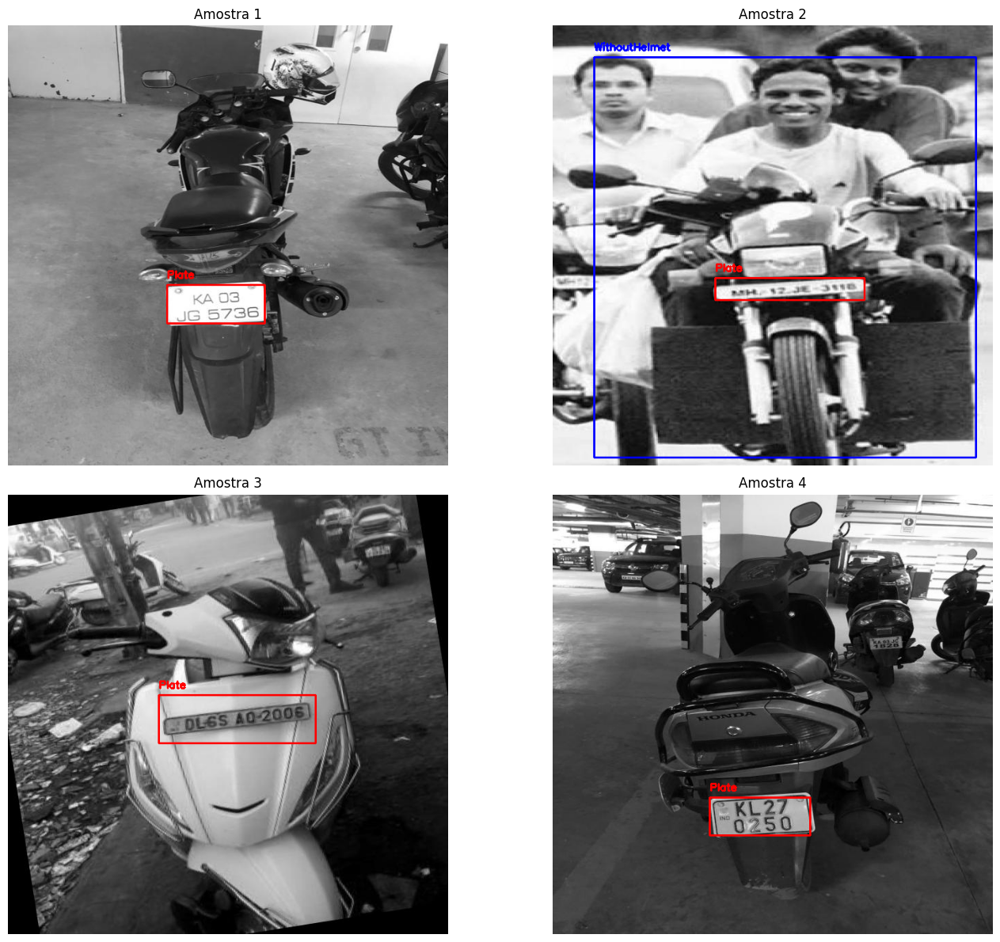

In [6]:
# Visualizar algumas imagens de exemplo com suas anotações
def visualize_samples(dataset_path, split='train', num_samples=4):
    """Visualiza amostras do dataset com as bounding boxes"""
    images_path = os.path.join(dataset_path, split, 'images')
    labels_path = os.path.join(dataset_path, split, 'labels')

    image_files = os.listdir(images_path)[:num_samples]

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.ravel()

    class_names = ['Plate', 'WithHelmet', 'WithoutHelmet']
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # BGR

    for idx, img_file in enumerate(image_files):
        # Carregar imagem
        img_path = os.path.join(images_path, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # Carregar anotações
        label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(labels_path, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])

                    # Converter coordenadas YOLO para pixels
                    x1 = int((x_center - width/2) * w)
                    y1 = int((y_center - height/2) * h)
                    x2 = int((x_center + width/2) * w)
                    y2 = int((y_center + height/2) * h)

                    # Desenhar bounding box
                    color = colors[class_id]
                    cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                    cv2.putText(img, class_names[class_id], (x1, y1-10),
                              cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        axes[idx].imshow(img)
        axes[idx].set_title(f'Amostra {idx+1}')
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

# Visualizar amostras
visualize_samples(dataset_path, 'train', 4)

In [7]:

print("RETREINANDO COM CONFIGURAÇÕES OTIMIZADAS...\n")

model_optimized = YOLO('yolov8s.pt')  # Pode usar 'yolov8m.pt' se tiver GPU potente

print("Modelo YOLOv8s carregado")
print("Iniciando treinamento otimizado...\n")

RETREINANDO COM CONFIGURAÇÕES OTIMIZADAS...

Modelo YOLOv8s carregado (mais preciso que nano)
Iniciando treinamento otimizado...



In [8]:
# Treinar com configurações otimizadas para detecção de pessoas sem capacete
results_optimized = model_optimized.train(
    data=data_yaml,
    epochs=30,                # Mais épocas para melhor aprendizado
    imgsz=640,
    batch=8,                   # Batch menor para modelo maior
    patience=20,               # Mais paciência
    save=True,
    device=device,
    workers=4,
    project='helmet_detection',
    name='yolov8s_optimized',
    exist_ok=True,
    pretrained=True,
    optimizer='AdamW',
    lr0=0.001,                 # Learning rate inicial reduzido
    lrf=0.01,                  # Learning rate final
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=3.0,
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,
    box=7.5,                   # Box loss gain (aumentado)
    cls=0.5,                   # Classification loss gain
    dfl=1.5,                   # DFL loss gain
    # Data Augmentation (mais agressivo)
    hsv_h=0.015,              # HSV-Hue augmentation
    hsv_s=0.7,                # HSV-Saturation augmentation
    hsv_v=0.4,                # HSV-Value augmentation
    degrees=10.0,             # Rotação de imagens
    translate=0.1,            # Translação
    scale=0.9,                # Escala
    shear=0.0,                # Shear
    perspective=0.0,          # Perspectiva
    flipud=0.0,               # Flip vertical
    fliplr=0.5,               # Flip horizontal (50%)
    mosaic=1.0,               # Mosaic augmentation
    mixup=0.15,               # Mixup augmentation (aumentado)
    copy_paste=0.3,           # Copy-paste augmentation (aumentado)
    # Outros
    verbose=True,
    seed=42,
    deterministic=True,
    cos_lr=True,
    close_mosaic=15,          # Desabilitar mosaic nos últimos 15 epochs
    amp=True,
    fraction=1.0,
    overlap_mask=True,
    mask_ratio=4,
    dropout=0.0,
    val=True,
)

print("\n✓ Treinamento otimizado concluído!")

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=15, cls=0.5, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.15, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s_optimized, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW,

In [9]:
# Avaliar modelo otimizado
metrics_optimized = model_optimized.val()

print("\nMÉTRICAS DO MODELO OTIMIZADO:")
print("=" * 50)
print(f"mAP50: {metrics_optimized.box.map50:.4f}")
print(f"mAP50-95: {metrics_optimized.box.map:.4f}")
print(f"Precision: {metrics_optimized.box.mp:.4f}")
print(f"Recall: {metrics_optimized.box.mr:.4f}")
print("=" * 50)

# Métricas por classe
if hasattr(metrics_optimized.box, 'maps'):
    print("\nMétricas por Classe:")
    class_names = ['Plate', 'WithHelmet', 'WithoutHelmet']
    for i, (name, map_value) in enumerate(zip(class_names, metrics_optimized.box.maps)):
        print(f"  {name}: mAP50 = {map_value:.4f}")

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1278.1±746.2 MB/s, size: 58.9 KB)
val: Scanning /root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2/valid/labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 30/30 57.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.9it/s 1.0s
                   all         30         38      0.805      0.911      0.871      0.527
                 Plate         30         30      0.942      0.933      0.955      0.539
            WithHelmet          5          5      0.884        0.8      0.906      0.556
         WithoutHelmet          3          3      0.587          1      0.753      0.487
Speed: 6.9ms preprocess, 14.0ms inference, 0.0ms loss, 1.4ms postprocess per ima


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2/test/images/Motorcycle_Riding_Laws_and_Requirements_in_the_US_1920x1000_jpg.rf.c06df378f5bcd6987a3665f7f6531fbf.jpg: 640x640 (no detections), 16.2ms
Speed: 1.8ms preprocess, 16.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2/test/images/684_jpg.rf.208d6a95aa7801a64f5e160b6410774b.jpg: 640x640 (no detections), 16.2ms
Speed: 1.8ms preprocess, 16.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2/test/images/139_jpg.rf.ada2dd8796caecf74ec9c7a3e433b11e.jpg: 640x640 1 Plate, 16.2ms
Speed: 1.7ms preprocess, 16.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/helmet/versions/4/HelmetViolationsV2/test/images/photo-motorcyc

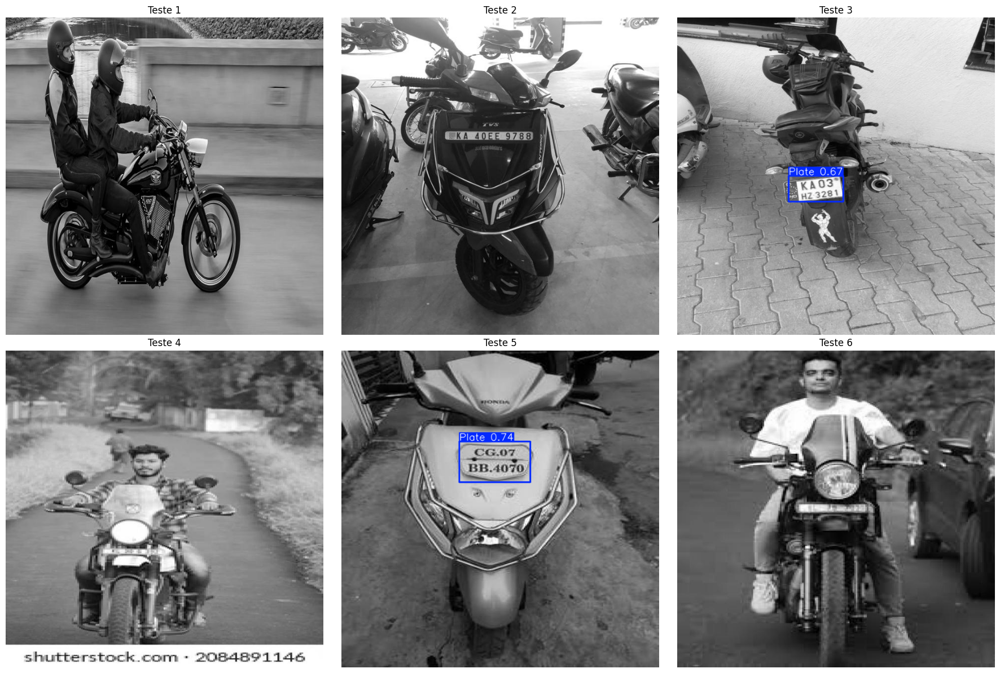


Predições realizadas com sucesso!


In [10]:
# Testar o modelo em imagens do conjunto de teste
test_images_path = os.path.join(dataset_path, 'test', 'images')
test_images = os.listdir(test_images_path)[:6]  # Testar com 6 imagens

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for idx, img_file in enumerate(test_images):
    img_path = os.path.join(test_images_path, img_file)

    # Fazer predição
    results = model_optimized.predict(img_path, conf=0.5, iou=0.45)

    # Obter imagem com predições desenhadas
    annotated_img = results[0].plot()
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(annotated_img)
    axes[idx].set_title(f'Teste {idx+1}', fontsize=12)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

print("\nPredições realizadas com sucesso!")

In [11]:
# Visualizar curvas de treinamento
from PIL import Image

# Caminhos para os gráficos gerados pelo YOLO
results_path = 'helmet_detection/yolov8_helmet'

print("VISUALIZANDO RESULTADOS DO TREINAMENTO:\n")

# Verificar se os arquivos existem
if os.path.exists(results_path):
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    plots = [
        ('results.png', 'Métricas de Treinamento'),
        ('confusion_matrix.png', 'Matriz de Confusão'),
        ('F1_curve.png', 'Curva F1'),
        ('PR_curve.png', 'Curva Precision-Recall')
    ]

    for idx, (filename, title) in enumerate(plots):
        file_path = os.path.join(results_path, filename)
        if os.path.exists(file_path):
            img = Image.open(file_path)
            axes[idx // 2, idx % 2].imshow(img)
            axes[idx // 2, idx % 2].set_title(title, fontsize=14, fontweight='bold')
            axes[idx // 2, idx % 2].axis('off')
        else:
            axes[idx // 2, idx % 2].text(0.5, 0.5, f'{filename} não encontrado',
                                         ha='center', va='center')
            axes[idx // 2, idx % 2].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print(f"Diretório de resultados não encontrado: {results_path}")

VISUALIZANDO RESULTADOS DO TREINAMENTO:

Diretório de resultados não encontrado: helmet_detection/yolov8_helmet


TESTE COM DETECÇÃO MELHORADA:

Configurações:
  • Confidence WithHelmet: 0.50 (50%)
  • Confidence WithoutHelmet: 0.25 (25% - mais sensível)
  • Confidence Plate: 0.50 (50%)



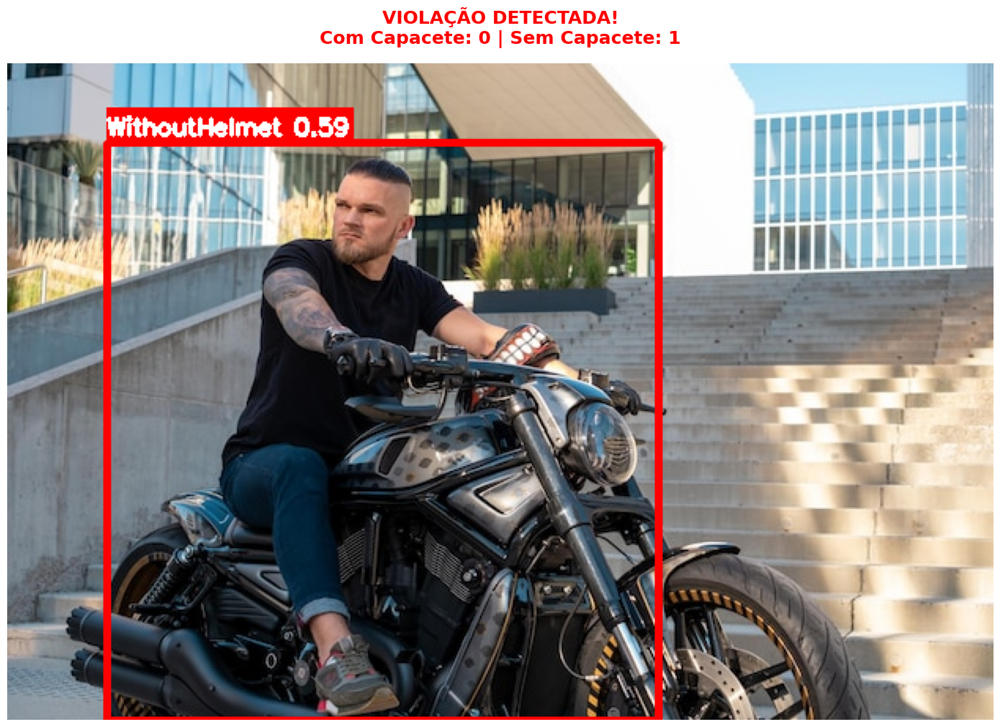

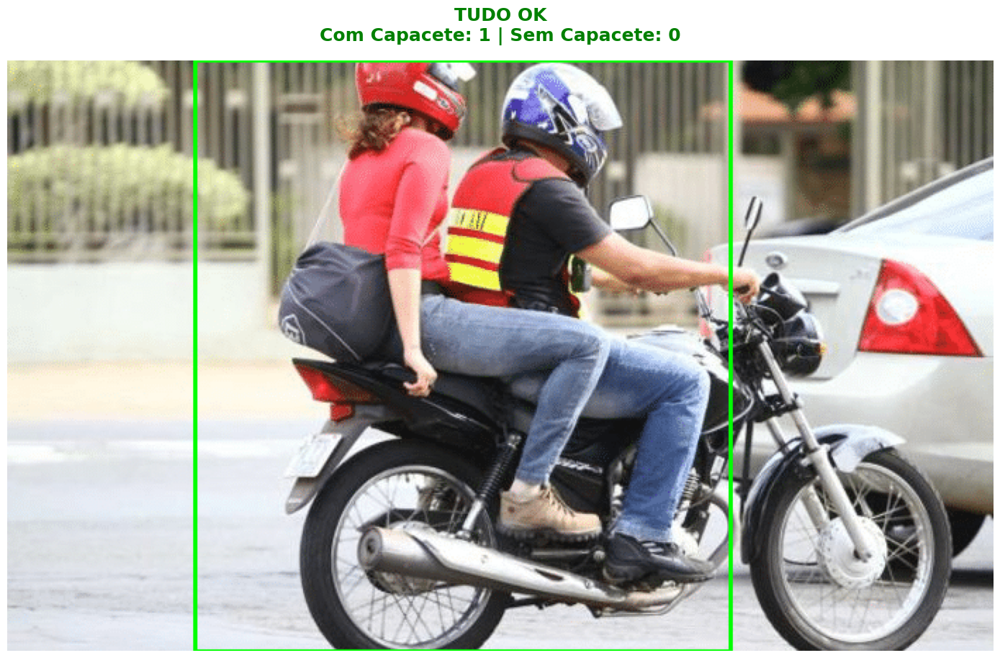

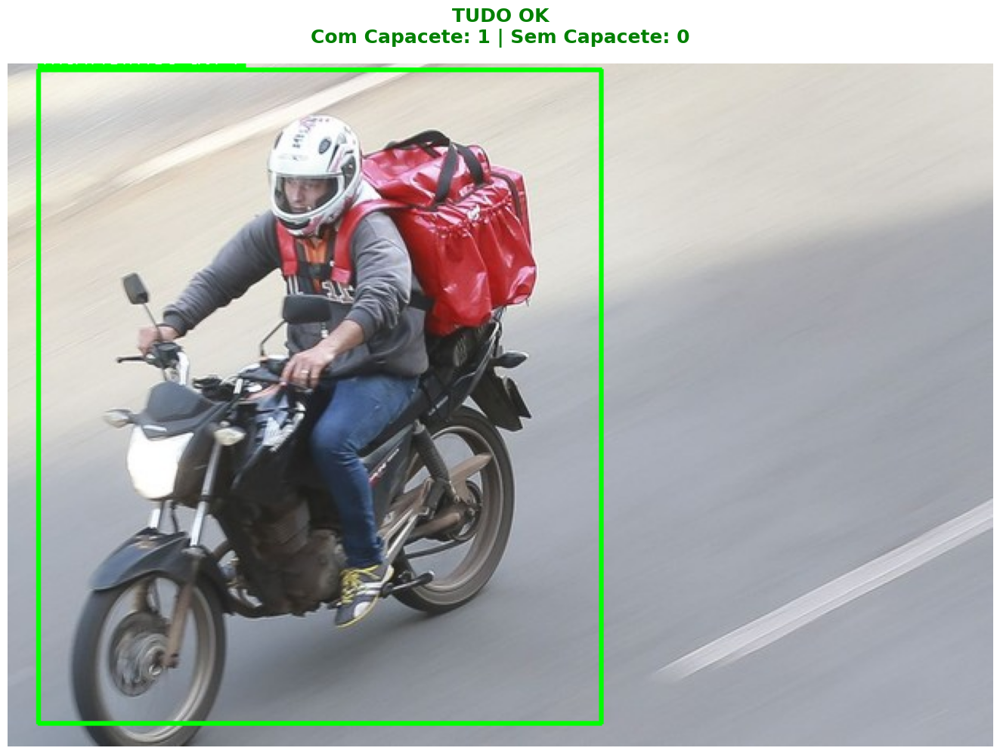

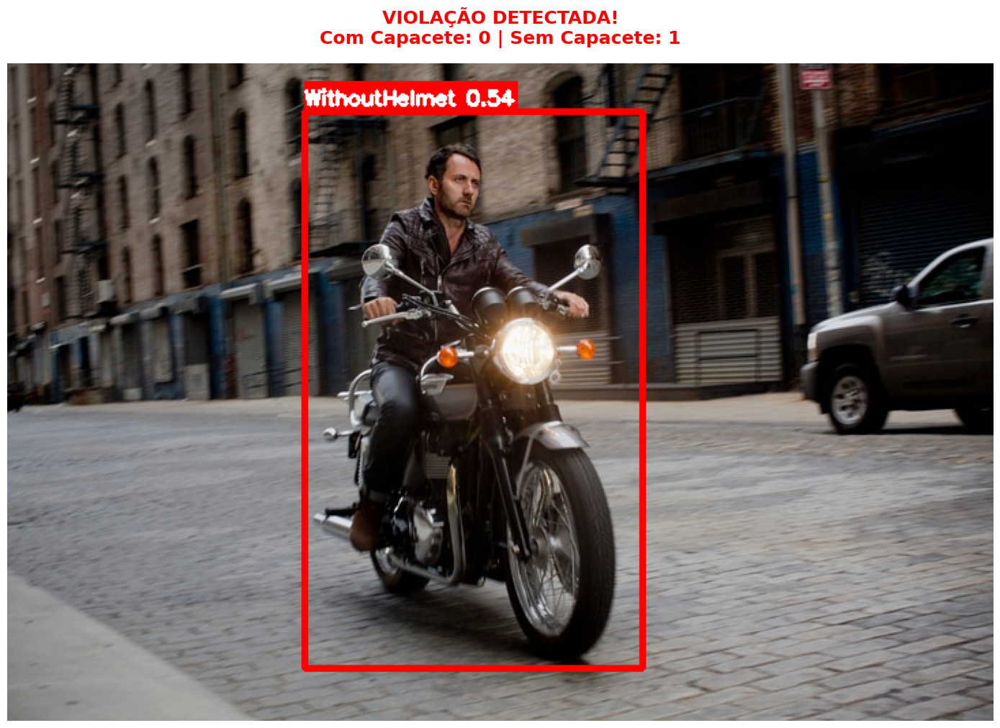


Resultado:
  • Motoqueiros com capacete: 0
  • Motoqueiros SEM capacete: 1
  • Violação: SIM


In [12]:

def detect_helmet_violations_improved(image_path, conf_with_helmet=0.5, conf_without_helmet=0.25):
    """
    Versão melhorada com thresholds diferentes por classe

    Args:
        image_path: Caminho para a imagem
        conf_with_helmet: Confiança para "WithHelmet" (padrão: 0.5)
        conf_without_helmet: Confiança para "WithoutHelmet" (padrão: 0.25 - mais sensível)
    """
    # Fazer predição com threshold mais baixo
    results = model_optimized.predict(image_path, conf=0.2, iou=0.4, verbose=False)

    violations = []
    with_helmet = 0
    without_helmet = 0

    # Filtrar por classe e aplicar thresholds específicos
    for result in results:
        boxes = result.boxes
        for box in boxes:
            class_id = int(box.cls[0])
            class_name = result.names[class_id]
            conf = float(box.conf[0])

            # Aplicar threshold específico por classe
            if class_name == 'WithoutHelmet' and conf >= conf_without_helmet:
                without_helmet += 1
                violations.append({
                    'class': class_name,
                    'confidence': conf,
                    'bbox': box.xyxy[0].tolist()
                })
            elif class_name == 'WithHelmet' and conf >= conf_with_helmet:
                with_helmet += 1

    # Visualizar com anotações customizadas
    # Usar results[0].orig_img que já foi carregada pela função predict
    img_bgr = results[0].orig_img.copy() # Obter a imagem original (formato BGR)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # Desenhar detecções
    for result in results:
        boxes = result.boxes
        for box in boxes:
            class_id = int(box.cls[0])
            class_name = result.names[class_id]
            conf = float(box.conf[0])

            # Verificar threshold
            if (class_name == 'WithoutHelmet' and conf >= conf_without_helmet) or \
               (class_name == 'WithHelmet' and conf >= conf_with_helmet) or \
               (class_name == 'Plate' and conf >= 0.5):

                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())

                # Cores por classe
                if class_name == 'WithoutHelmet':
                    color = (255, 0, 0)  # Vermelho
                    thickness = 3
                elif class_name == 'WithHelmet':
                    color = (0, 255, 0)  # Verde
                    thickness = 2
                else:  # Plate
                    color = (0, 165, 255)  # Laranja
                    thickness = 2

                cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color, thickness)

                # Label com confiança
                label = f'{class_name} {conf:.2f}'
                label_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
                cv2.rectangle(img_rgb, (x1, y1 - label_size[1] - 10),
                            (x1 + label_size[0], y1), color, -1)
                cv2.putText(img_rgb, label, (x1, y1 - 5),
                          cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    # Mostrar resultado
    plt.figure(figsize=(14, 10))
    plt.imshow(img_rgb)
    plt.axis('off')

    status = "VIOLAÇÃO DETECTADA!" if without_helmet > 0 else "TUDO OK"
    color_title = 'red' if without_helmet > 0 else 'green'

    plt.title(f'{status}\nCom Capacete: {with_helmet} | Sem Capacete: {without_helmet}',
              fontsize=18, fontweight='bold', color=color_title, pad=20)
    plt.tight_layout()
    plt.show()

    return {
        'violations': violations,
        'with_helmet': with_helmet,
        'without_helmet': without_helmet,
        'has_violation': without_helmet > 0
    }

# Testar com threshold reduzido para "WithoutHelmet"
print("TESTE COM DETECÇÃO MELHORADA:\n")
print("Configurações:")
print("  • Confidence WithHelmet: 0.50 (50%)")
print("  • Confidence WithoutHelmet: 0.25 (25% - mais sensível)")
print("  • Confidence Plate: 0.50 (50%)\n")
test_images_path = os.path.join(dataset_path, 'test', 'images')
test_images = os.listdir(test_images_path) # Redefine test_images

test_imgs = [
    "https://img.freepik.com/fotos-premium/bonito-motociclista-sem-capacete-sentado-em-sua-moto-contra-fundo-urbano-foto-de-alta-qualidade_647221-140.jpg",
    "https://vitoriainforma.com/wp-content/uploads/2025/09/image-1.png",
    "https://s2.glbimg.com/sJ3lTA2ZyWFZ7ACFdnP_C3LNllA=/620x430/e.glbimg.com/og/ed/f/original/2020/03/30/delivery_de_comidaabr_20032000136.jpg",
    "https://mobilidade.estadao.com.br/wp-content/uploads/2020/03/GettyImages_sem-capacete.jpg"
    ]

for i in range(len(test_imgs)):
  result = detect_helmet_violations_improved(test_imgs[i], conf_with_helmet=0.5, conf_without_helmet=0.25)

print(f"\nResultado:")
print(f"  • Motoqueiros com capacete: {result['with_helmet']}")
print(f"  • Motoqueiros SEM capacete: {result['without_helmet']}")
print(f"  • Violação: {'SIM' if result['has_violation'] else 'NÃO'}")

# CNN para Detecção de Motoqueiros sem Capacete

Este notebook implementa uma **CNN (Rede Neural Convolucional)** usando **YOLOv8** para detectar motoqueiros sem capacete.

## Estrutura do Projeto

1. **Instalação de Dependências** - Instalar bibliotecas necessárias
2. **Carregamento do Dataset** - Dataset HelmetViolationsV2 com 3 classes
3. **Exploração de Dados** - Visualizar imagens com anotações
4. **Treinamento da CNN** - Treinar YOLOv8 com o dataset
5. **Avaliação** - Métricas de performance (mAP, Precision, Recall)
6. **Teste e Inferência** - Detectar violações em novas imagens
7. **Exportação** - Salvar modelo para produção

## Classes Detectadas

- **Plate**: Placa do veículo
- **WithHelmet**: Motoqueiro COM capacete
- **WithoutHelmet**: Motoqueiro SEM capacete

## Como Usar

Execute as células sequencialmente para treinar o modelo. Após o treinamento, use a função `detect_helmet_violations_improved()` para detectar violações em novas imagens.